In [1]:
!pip install roboflow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.8/195.8 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 101.3 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.13
    Uninstalling idna-3.13:
      Successfully uninstalled idna-3.13


download the data

In [2]:
import os
import random
import shutil
from collections import defaultdict, Counter


In [3]:
from roboflow import Roboflow
rf = Roboflow(api_key="0kyd9w6uQeTH5BPVqyGF")
project = rf.workspace("brad-dwyer").project("aquarium-combined")
version = project.version(6)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Aquarium-Combined-6 in yolov11:: 100%|██████████| 1288/1288 [00:01<00:00, 1096.36it/s]


In [4]:
cd Aquarium-Combined-6

/content/Aquarium-Combined-6


In [5]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 29.4 MB/s eta 0:00:00


In [ ]:
cd Aquarium-Combined-6

[Errno 2] No such file or directory: 'Aquarium-Combined-6'
/content/Aquarium-Combined-6


check the dataset

In [ ]:
import os
from collections import Counter

label_dir = "/content/Aquarium-Combined-6/train/labels"  # 改成你的路徑

counter = Counter()
num_images = 0

for fn in os.listdir(label_dir):
    if fn.endswith(".txt"):
        num_images += 1
        with open(os.path.join(label_dir, fn)) as f:
            for line in f:
                cls = int(line.split()[0])
                counter[cls] += 1

total = sum(counter.values())

print(f"Images: {num_images}, Instances: {total}")
names = ["fish","jellyfish","penguin","puffin","shark","starfish","stingray"]

for cls, cnt in sorted(counter.items()):
    print(f"{names[cls]:10s}: {cnt} ({cnt/total:.2%})")

Images: 448, Instances: 3328
fish      : 1965 (59.04%)
jellyfish : 385 (11.57%)
penguin   : 330 (9.92%)
puffin    : 175 (5.26%)
shark     : 259 (7.78%)
starfish  : 78 (2.34%)
stingray  : 136 (4.09%)


In [ ]:
from PIL import Image

img = Image.open("/content/Aquarium-Combined-6/test/images/IMG_2289_jpeg_jpg.rf.a56bc9be7aed57907c19762cb39801a5.jpg")
print(img.size)

(1536, 2048)


baseline


In [ ]:
from ultralytics import YOLO

# 載入 YOLOv8 model
model = YOLO("yolo11m.pt")

model.train(
    data="data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    device=0,
    pretrained=True,
    augment=True,
    patience=20,
    name="yolov11_baseline_aquarium"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, i

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")

metrics = model.val(
    data="/content/Aquarium-Combined-6/data.yaml",
    split="test",
    imgsz=640
)

Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11m summary (fused): 126 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1936.7±749.4 MB/s, size: 651.5 KB)
val: Scanning /content/Aquarium-Combined-6/test/labels... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 978.1it/s 0.1s
val: New cache created: /content/Aquarium-Combined-6/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.3s/it 5.2s
                   all         63        584      0.847      0.751      0.832      0.501
                  fish         30        249      0.782      0.767      0.807      0.474
             jellyfish         11        154      0.844      0.841      0.872      0.572
               penguin          7         82      0.845      0.799      0.842       0.36
                puffin          6         35      0.759      

# augmentation

**1. cl=1.5**


In [ ]:
from ultralytics import YOLO

# 載入 YOLOv8 model
model = YOLO("yolo11m.pt")

model.train(
    data="data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    device=0,
    pretrained=True,
    cls=1.5,
    augment=True,
    patience=20,
    name="yolov11_cl15_aquarium"
)

Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=1.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov11_cl15_aquarium, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspec

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7880cd0ee4b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/Aquarium-Combined-6/runs/detect/yolov11_cl15_aquarium/weights/best.pt")

metrics = model.val(
    data="/content/Aquarium-Combined-6/data.yaml",
    split="test",
    imgsz=640
)

Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11m summary (fused): 126 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 21.0±8.6 MB/s, size: 344.2 KB)
val: Scanning /content/Aquarium-Combined-6/test/labels... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 222.2it/s 0.3s
val: New cache created: /content/Aquarium-Combined-6/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.8s/it 7.2s
                   all         63        584      0.887      0.723      0.807      0.503
                  fish         30        249      0.838      0.707      0.779      0.478
             jellyfish         11        154      0.861      0.831      0.861      0.559
               penguin          7         82      0.831      0.707      0.771      0.348
                puffin          6         35      0.887      0.44

In [ ]:
from ultralytics import YOLO

# 載入 YOLOv8 model
model = YOLO("yolo11m.pt")

model.train(
    data="data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    device=0,
    pretrained=True,
    augment=True,        # enable augmentation
    mosaic=1.0,          # mosaic augmentation
    mixup=0.1,           # mixup augmentation
    copy_paste=0.1,      # copy paste - helps rare classes
    patience=20,
    project="/content/runs",
    name="yolov11_augmented"
)

Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov11_augmented, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ea9b7b8d820>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs/yolov11_augmented/weights/best.pt")

metrics = model.val(
    data="/content/Aquarium-Combined-6/data.yaml",
    split="test",
    imgsz=640
)

Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11m summary (fused): 126 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2194.5±460.4 MB/s, size: 381.2 KB)
val: Scanning /content/Aquarium-Combined-6/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 26.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.5s/it 6.0s
                   all         63        584      0.926      0.712      0.844      0.522
                  fish         30        249      0.911      0.658      0.812      0.497
             jellyfish         11        154      0.877      0.789      0.885      0.575
               penguin          7         82      0.921      0.671      0.803      0.342
                puffin          6         35      0.944      0.479      0.634      0.332
                 shark         14    

# over sampling

In [ ]:
from pathlib import Path
import shutil

image_dir = Path("/content/Aquarium-Combined-6/train/images")
label_dir = Path("/content/Aquarium-Combined-6/train/labels")

puffin_class_id = "3"   # 確認你的 data.yaml 裡 puffin 是第幾類
copy_times = 1          # 每張 puffin 圖多複製 2 份

for label_path in label_dir.glob("*.txt"):
    lines = label_path.read_text().strip().splitlines()

    has_puffin = any(line.split()[0] == puffin_class_id for line in lines if line.strip())

    if has_puffin:
        image_path = None
        for ext in [".jpg", ".jpeg", ".png"]:
            candidate = image_dir / f"{label_path.stem}{ext}"
            if candidate.exists():
                image_path = candidate
                break

        if image_path is None:
            continue

        for i in range(copy_times):
            new_stem = f"{label_path.stem}_puffin_os{i+1}"
            shutil.copy(image_path, image_dir / f"{new_stem}{image_path.suffix}")
            shutil.copy(label_path, label_dir / f"{new_stem}.txt")

print("Oversampling finished.")

Oversampling finished.


In [ ]:
import os
from collections import Counter

label_dir = "/content/Aquarium-Combined-6/train/labels"  # 改成你的路徑

counter = Counter()
num_images = 0

for fn in os.listdir(label_dir):
    if fn.endswith(".txt"):
        num_images += 1
        with open(os.path.join(label_dir, fn)) as f:
            for line in f:
                cls = int(line.split()[0])
                counter[cls] += 1

total = sum(counter.values())

print(f"Images: {num_images}, Instances: {total}")
names = ["fish","jellyfish","penguin","puffin","shark","starfish","stingray"]

for cls, cnt in sorted(counter.items()):
    print(f"{names[cls]:10s}: {cnt} ({cnt/total:.2%})")

Images: 493, Instances: 3504
fish      : 1966 (56.11%)
jellyfish : 385 (10.99%)
penguin   : 330 (9.42%)
puffin    : 350 (9.99%)
shark     : 259 (7.39%)
starfish  : 78 (2.23%)
stingray  : 136 (3.88%)


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11m.pt")

model.train(
    data="data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    pretrained=True,
    augment=True,
    mosaic=1.0,
    scale=0.5,
    fliplr=0.5,
    close_mosaic=10,
    patience=20,
    name="yolo11_puffin_oversampling"
)

Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11_puffin_oversampling-3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=2

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78c3f41460f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/runs 4/detect/yolo11_puffin_oversampling-3/weights/best.pt")

metrics = model.val(
    data="/content/Aquarium-Combined-6/data.yaml",
    split="test",
    imgsz=640
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.42 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11m summary (fused): 126 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2059.2±613.1 MB/s, size: 580.9 KB)
val: Scanning /content/Aquarium-Combined-6/test/labels... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 981.4it/s 0.1s
val: New cache created: /content/Aquarium-Combined-6/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.7s/it 6.6s
                   all         63        584      0.886      0.689      0.797      0.492
                 

# Combined

In [ ]:
import torch
print(torch.__version__)
print(torch.__file__)

2.10.0+cu128
/usr/local/lib/python3.12/dist-packages/torch/__init__.py


In [ ]:
from ultralytics import YOLO

# 載入 YOLOv8 model
model = YOLO("yolo11m.pt")

model.train(
    data="data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    device=0,
    pretrained=True,
    augment=True,        # enable augmentation
    mosaic=1.0,          # mosaic augmentation
    mixup=0.1,           # mixup augmentation
    copy_paste=0.1,      # copy paste - helps rare classes
    patience=20,
    cls=1.5,
    name="yolov11_combined"
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.43 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=1.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, i

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f871cded460>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/Aquarium-Combined-6/runs/detect/yolov11_combined/weights/best.pt")

metrics = model.val(
    data="/content/Aquarium-Combined-6/data.yaml",
    split="test",
    imgsz=640
)



Ultralytics 8.4.43 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11m summary (fused): 126 layers, 20,035,429 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 26.1±17.0 MB/s, size: 344.6 KB)
val: Scanning /content/Aquarium-Combined-6/test/labels... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 218.6it/s 0.3s
val: New cache created: /content/Aquarium-Combined-6/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.4s/it 5.5s
                   all         63        584      0.846      0.775      0.836      0.528
                  fish         30        249      0.759      0.808      0.823      0.505
             jellyfish         11        154      0.817      0.857       0.88      0.569
               penguin          7         82      0.864      0.793      0.835      0.361
                puffin          6         35       0.77      0.4

# download the run fold

In [ ]:
!zip -r runs.zip runs

  adding: runs/ (stored 0%)
  adding: runs/detect/ (stored 0%)
  adding: runs/detect/yolov11_combined/ (stored 0%)
  adding: runs/detect/yolov11_combined/BoxPR_curve.png (deflated 9%)
  adding: runs/detect/yolov11_combined/train_batch0.jpg (deflated 2%)
  adding: runs/detect/yolov11_combined/train_batch2.jpg (deflated 1%)
  adding: runs/detect/yolov11_combined/confusion_matrix.png (deflated 22%)
  adding: runs/detect/yolov11_combined/val_batch2_pred.jpg (deflated 4%)
  adding: runs/detect/yolov11_combined/train_batch1.jpg (deflated 3%)
  adding: runs/detect/yolov11_combined/labels.jpg (deflated 25%)
  adding: runs/detect/yolov11_combined/val_batch0_pred.jpg (deflated 9%)
  adding: runs/detect/yolov11_combined/args.yaml (deflated 52%)
  adding: runs/detect/yolov11_combined/BoxF1_curve.png (deflated 7%)
  adding: runs/detect/yolov11_combined/val_batch1_pred.jpg (deflated 4%)
  adding: runs/detect/yolov11_combined/results.png (deflated 8%)
  adding: runs/detect/yolov11_combined/val_batch1

In [ ]:
from google.colab import files
files.download("runs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!unzip 'runs 4.zip' -d /content/

Archive:  runs 4.zip
  inflating: /content/__MACOSX/._runs 4  
   creating: /content/runs 4/detect/
  inflating: /content/__MACOSX/runs 4/._detect  
  inflating: /content/runs 4/.DS_Store  
  inflating: /content/__MACOSX/runs 4/._.DS_Store  
  inflating: /content/runs 4/detect/.DS_Store  
  inflating: /content/__MACOSX/runs 4/detect/._.DS_Store  
   creating: /content/runs 4/detect/yolo11_puffin_oversampling-3/
  inflating: /content/__MACOSX/runs 4/detect/._yolo11_puffin_oversampling-3  
   creating: /content/runs 4/detect/val_cl15/
  inflating: /content/__MACOSX/runs 4/detect/._val_cl15  
   creating: /content/runs 4/detect/yolov11_baseline_aquarium/
  inflating: /content/__MACOSX/runs 4/detect/._yolov11_baseline_aquarium  
   creating: /content/runs 4/detect/yolov11_cl15_aquarium/
  inflating: /content/__MACOSX/runs 4/detect/._yolov11_cl15_aquarium  
   creating: /content/runs 4/detect/val_baseline/
  inflating: /content/__MACOSX/runs 4/detect/._val_baseline  
   creating: /content/r

In [ ]:
from pathlib import Path
import shutil

dataset_dir = Path("/content/Aquarium-Combined-6")
label_dir = dataset_dir / "train" / "labels"
image_dir = dataset_dir / "train" / "images"

puffin_class_id = 3

puffin_images = []

for label_path in label_dir.glob("*.txt"):
    with open(label_path, "r") as f:
        lines = f.readlines()

    has_puffin = any(line.strip().split()[0] == str(puffin_class_id) for line in lines)

    if has_puffin:
        image_path_jpg = image_dir / (label_path.stem + ".jpg")
        image_path_png = image_dir / (label_path.stem + ".png")
        image_path = image_path_jpg if image_path_jpg.exists() else image_path_png

        puffin_images.append(image_path)

print("Number of training images with puffin:", len(puffin_images))
for img in puffin_images:
    print(img)

Number of training images with puffin: 45
/content/Aquarium-Combined-6/train/images/IMG_2290_jpeg_jpg.rf.6cfc59b4cdb4a2ccb7c81aff3783d6cf.jpg
/content/Aquarium-Combined-6/train/images/IMG_2285_jpeg_jpg.rf.f0e3a62b8ed8651386c643ef10419ab1.jpg
/content/Aquarium-Combined-6/train/images/IMG_8531_jpg.rf.5fd3d282ee6ebc6650a4f9e7af27caac.jpg
/content/Aquarium-Combined-6/train/images/IMG_3157_jpeg_jpg.rf.90de5fecd2b20c841f879e869c748f61.jpg
/content/Aquarium-Combined-6/train/images/IMG_3155_jpeg_jpg.rf.d1e6db16705ac833db0baa66157b6d9c.jpg
/content/Aquarium-Combined-6/train/images/IMG_3132_jpeg_jpg.rf.e53e7d2d2def8d1c9c91882967ee1ac6.jpg
/content/Aquarium-Combined-6/train/images/IMG_8534_jpg.rf.a7e44dd44f6c9ad100b8b754e37f4a35.jpg
/content/Aquarium-Combined-6/train/images/IMG_3138_jpeg_jpg.rf.8a8684fbfa52236dd3716f5f68eec7c4.jpg
/content/Aquarium-Combined-6/train/images/IMG_2299_jpeg_jpg.rf.20a135d0342170cc8f6bc19c74a35ac7.jpg
/content/Aquarium-Combined-6/train/images/IMG_8535_MOV-3_jpg.rf.74bc

In [ ]:
from pathlib import Path
import shutil

dataset_dir = Path("/content/Aquarium-Combined-6")
label_dir = dataset_dir / "train" / "labels"
image_dir = dataset_dir / "train" / "images"

starfish_class_id = 5

starfish_images = []

for label_path in label_dir.glob("*.txt"):
    with open(label_path, "r") as f:
        lines = f.readlines()

    has_starfish = any(line.strip().split()[0] == str(starfish_class_id) for line in lines)

    if has_starfish:
        image_path_jpg = image_dir / (label_path.stem + ".jpg")
        image_path_png = image_dir / (label_path.stem + ".png")
        image_path = image_path_jpg if image_path_jpg.exists() else image_path_png

        starfish_images.append(image_path)

print("Number of training images with starfish:", len(starfish_images))
for img in starfish_images:
    print(img)

Number of training images with starfish: 37
/content/Aquarium-Combined-6/train/images/IMG_3187_jpeg_jpg.rf.fc33278a03e4c00408c7b65cf30e58e9.jpg
/content/Aquarium-Combined-6/train/images/IMG_2609_jpeg_jpg.rf.7738960e9ea27a6587f947912bc35c8d.jpg
/content/Aquarium-Combined-6/train/images/IMG_2533_jpeg_jpg.rf.1d1c2f0989627bc5548b7e17b4747150.jpg
/content/Aquarium-Combined-6/train/images/IMG_2548_jpeg_jpg.rf.24d2bd4e0472f32556c24db4eb34e800.jpg
/content/Aquarium-Combined-6/train/images/IMG_3127_jpeg_jpg.rf.d941b6c6564c1cbdedb4767c11f451f2.jpg
/content/Aquarium-Combined-6/train/images/IMG_3188_jpeg_jpg.rf.7813755a1eafb73a3ca19b2f8f0fb0f5.jpg
/content/Aquarium-Combined-6/train/images/IMG_2359_jpeg_jpg.rf.a3d1b4337237ef5e453b33f4aaaf0b50.jpg
/content/Aquarium-Combined-6/train/images/IMG_3125_jpeg_jpg.rf.6f84fde2542e57a822082d0df482f130.jpg
/content/Aquarium-Combined-6/train/images/IMG_2383_jpeg_jpg.rf.e9bbd05155dcac8430a11232df9ec552.jpg
/content/Aquarium-Combined-6/train/images/IMG_3182_jpeg_

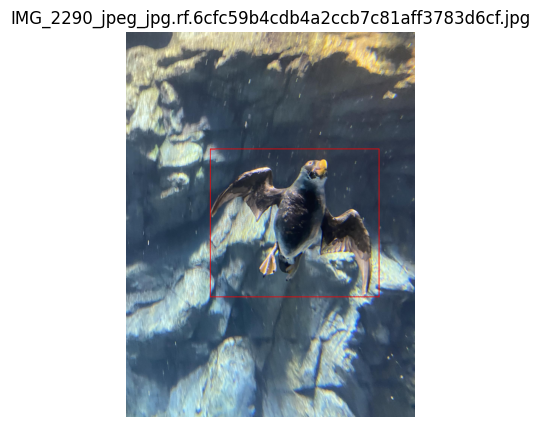

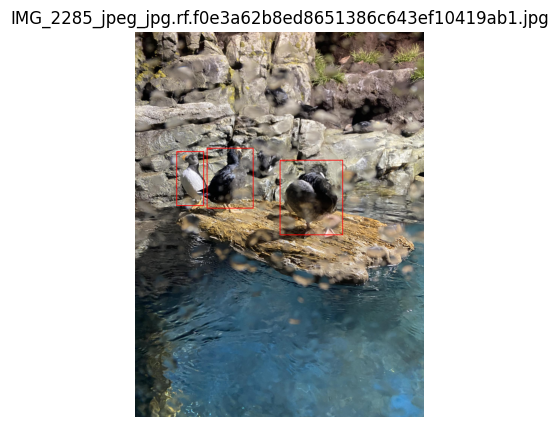

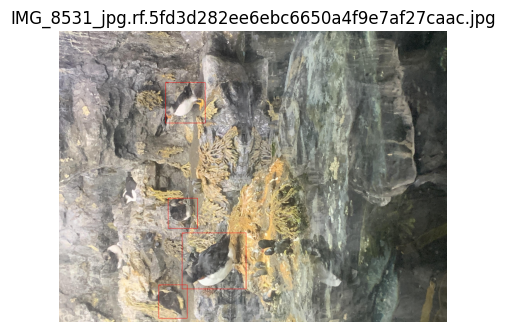

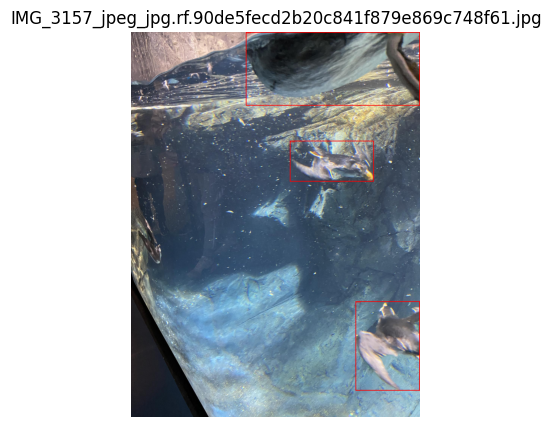

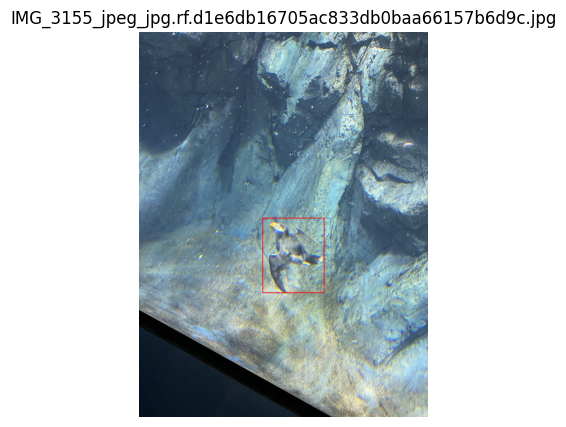

...

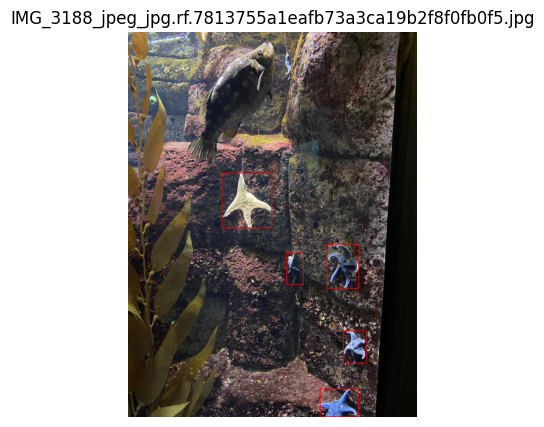

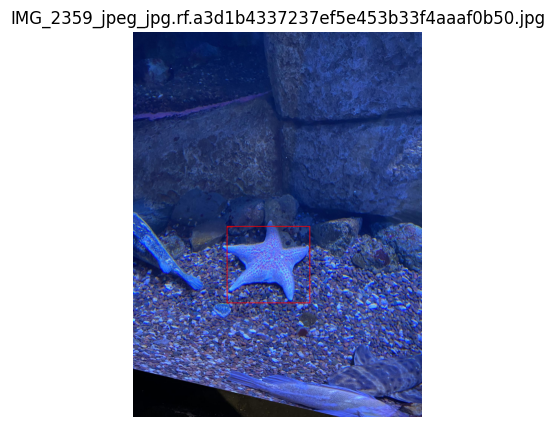

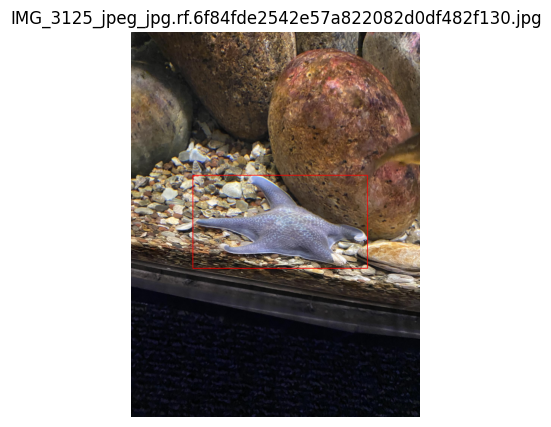

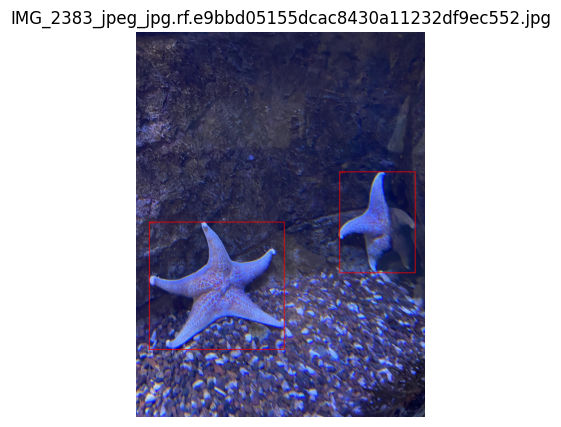

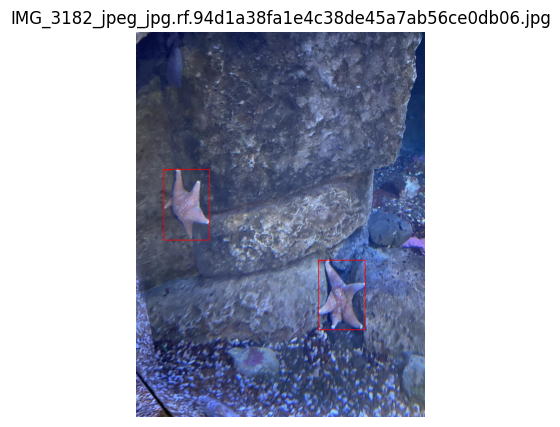

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from pathlib import Path

# class id（確認你的 data.yaml）
puffin_id = 3
starfish_id = 5

def show_images_with_boxes(image_paths, class_id, class_name):
    for img_path in image_paths[:10]:
        img = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        w, h = img.size

        # 對應 label 路徑
        label_path = Path(str(img_path).replace("/images/", "/labels/")).with_suffix(".txt")

        if label_path.exists():
            with open(label_path, "r") as f:
                for line in f:
                    cls, x, y, bw, bh = map(float, line.split())

                    if int(cls) == class_id:
                        # YOLO → pixel
                        x1 = (x - bw / 2) * w
                        y1 = (y - bh / 2) * h
                        x2 = (x + bw / 2) * w
                        y2 = (y + bh / 2) * h

                        # 畫框
                        draw.rectangle([x1, y1, x2, y2], outline="red", width=4)
                        draw.text((x1, y1), class_name, fill="red")

        plt.figure(figsize=(5,5))
        plt.imshow(img)
        plt.title(img_path.name)
        plt.axis("off")
        plt.show()


# 🔴 puffin
show_images_with_boxes(puffin_images, puffin_id, "puffin")

# 🔵 starfish
show_images_with_boxes(starfish_images, starfish_id, "starfish")

# Who is most like jellyfish

In [22]:
from ultralytics import YOLO
from pathlib import Path

model = YOLO("/content/best.pt")

team_dir = Path("/content/team")

results = model.predict(
    source=str(team_dir),
    imgsz=640,
    conf=0.1,
    save=True
)


image 1/3 /content/team/Selfie of HsuanChu.jpg: 640x384 3 fishs, 1 shark, 25.0ms
image 2/3 /content/team/Selfie_of_intishar.jpg: 640x480 1 fish, 1 shark, 29.5ms
image 3/3 /content/team/selfish Ruiji.jpeg: 640x480 4 fishs, 2 jellyfishs, 2 starfishs, 1 stingray, 28.3ms
Speed: 2.8ms preprocess, 27.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/Aquarium-Combined-6/runs/detect/predict-6


In [23]:
class_names = model.names
jellyfish_id = None

for k, v in class_names.items():
    if v == "jellyfish":
        jellyfish_id = k

scores = {}

for r in results:
    image_name = Path(r.path).name
    best_score = 0

    for box in r.boxes:
        cls_id = int(box.cls.item())
        conf = float(box.conf.item())

        if cls_id == jellyfish_id:
            best_score = max(best_score, conf)

    scores[image_name] = best_score

print(scores)

winner = max(scores, key=scores.get)
print("Most like jellyfish:", winner, "score:", scores[winner])

{'Selfie of HsuanChu.jpg': 0, 'Selfie_of_intishar.jpg': 0, 'selfish Ruiji.jpeg': 0.23411421477794647}
Most like jellyfish: selfish Ruiji.jpeg score: 0.23411421477794647


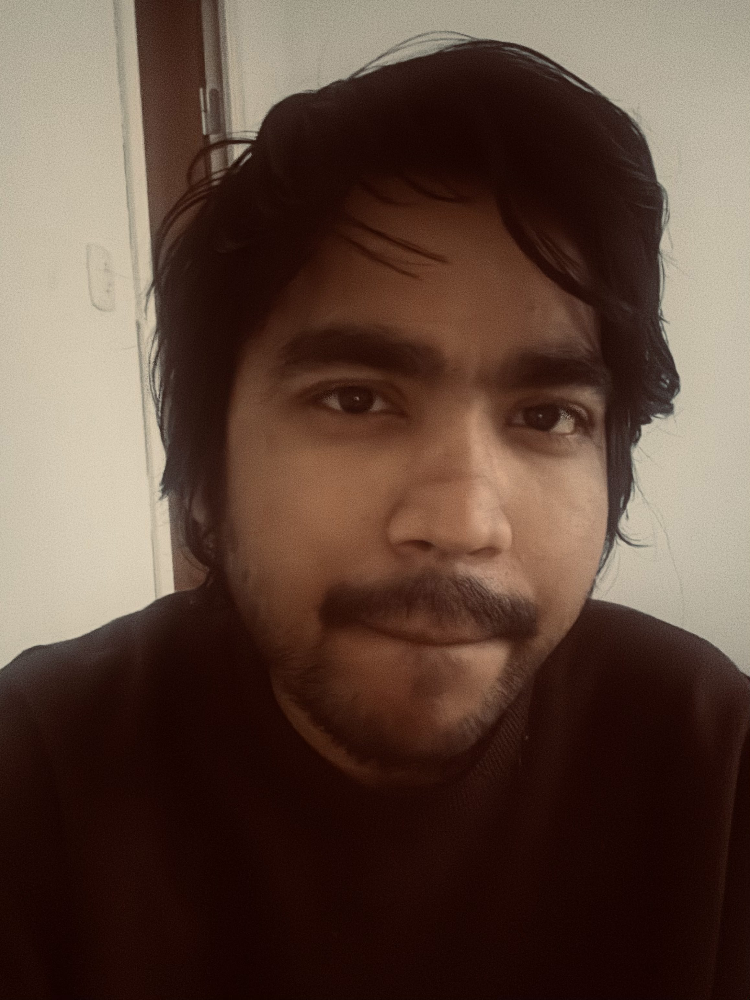

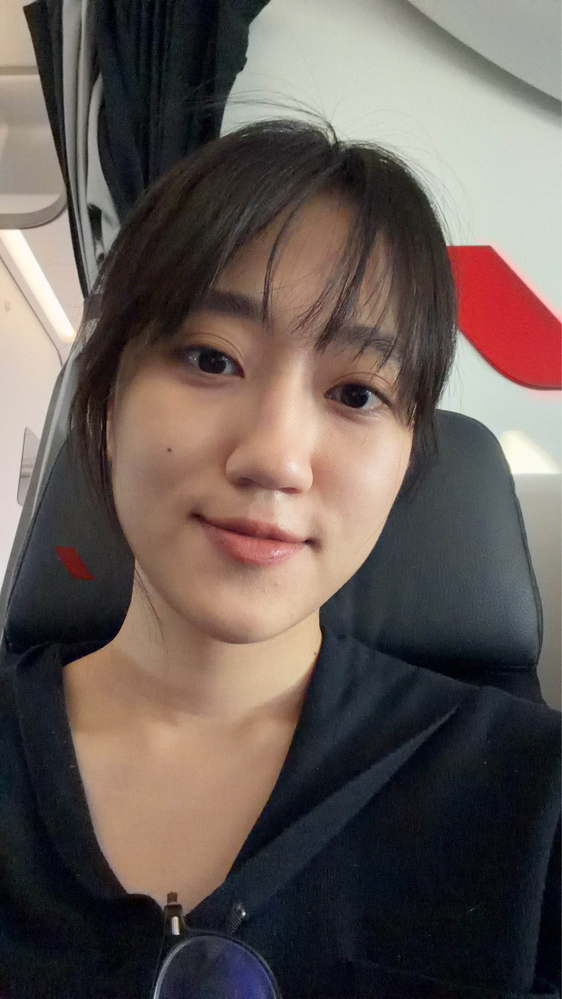

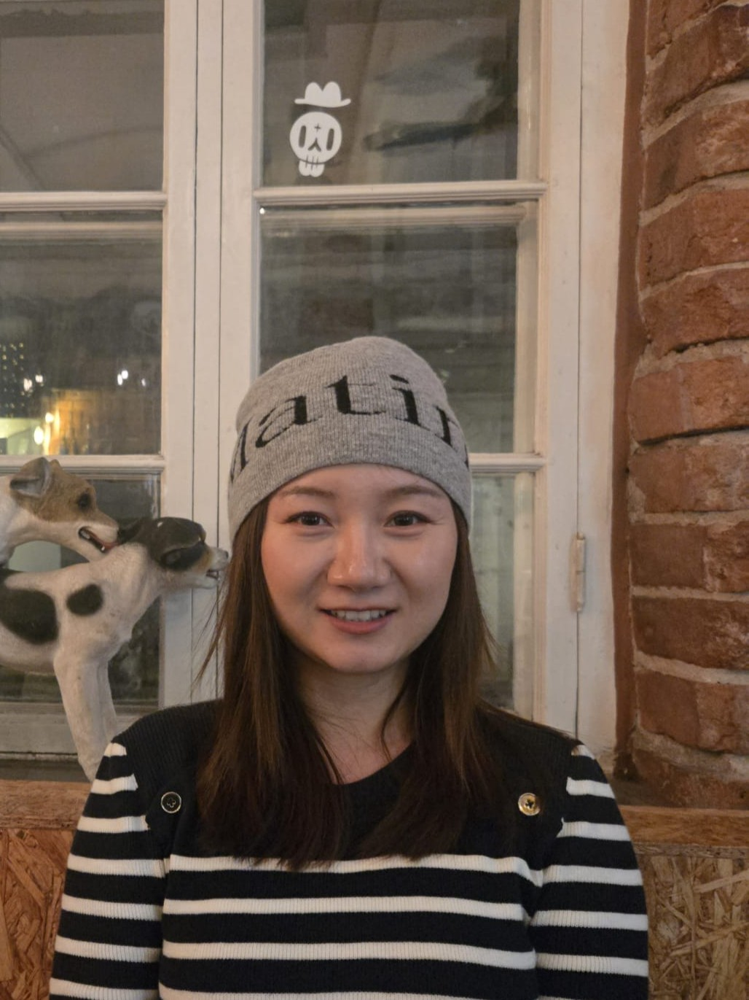

In [24]:
from glob import glob
from pathlib import Path
from IPython.display import Image, display

pred_imgs = glob("/content/team/*.jpg") \
          + glob("/content/team/*.jpeg")

for img in pred_imgs:
    display(Image(img))

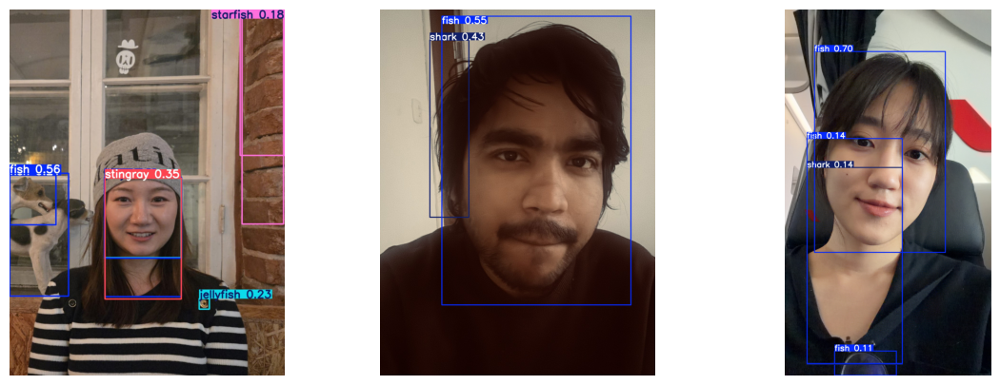

In [28]:
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image

# YOLO predict 輸出資料夾
save_dir = Path(results[0].save_dir)

imgs = [
    p for p in save_dir.glob("*")
    if p.suffix.lower() in [".jpg", ".jpeg", ".png"]
]

imgs = imgs[:3]

plt.figure(figsize=(15, 5))

for i, img_path in enumerate(imgs):
    img = Image.open(img_path)
    plt.subplot(1, 3, i + 1)
    plt.imshow(img)
    # plt.title(img_path.name)
    plt.axis("off")

# 👉 調整間距（重點）
plt.subplots_adjust(wspace=0.01, hspace=0)

plt.show()